In [20]:
!pip install ipynb
!pip install nbimporter

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.308 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.
scene-0061, Parked truck, construction, intersectio... [18-07-24 03:28:47]   19s, singapore-onenorth, #anns:4622
scene-0103, Many peds right, wait for turning car, ... [18-08-01 19:26:43]   19s, boston-seaport, #anns:2046
scene-0655, Parking lot, parked cars, jaywalker, be... [18-08-27 15:51:32]   20s, boston-seaport, #anns:2332
scene-0553, Wait at intersection, bicycle, large tr... [18-08-28 20:48:16]   20s, boston-seaport, #anns:1950
scene-0757, Arrive at busy intersection, bus, wait ... [18-08-30 19:25:08]   20s, boston-seaport, #anns:592
scene-0796, Scooter, peds on sidewalk, bus, cars, t... [18-10-02 02:52:24]   20s, singapore-queensto, #anns:708
scene-0916, Parki

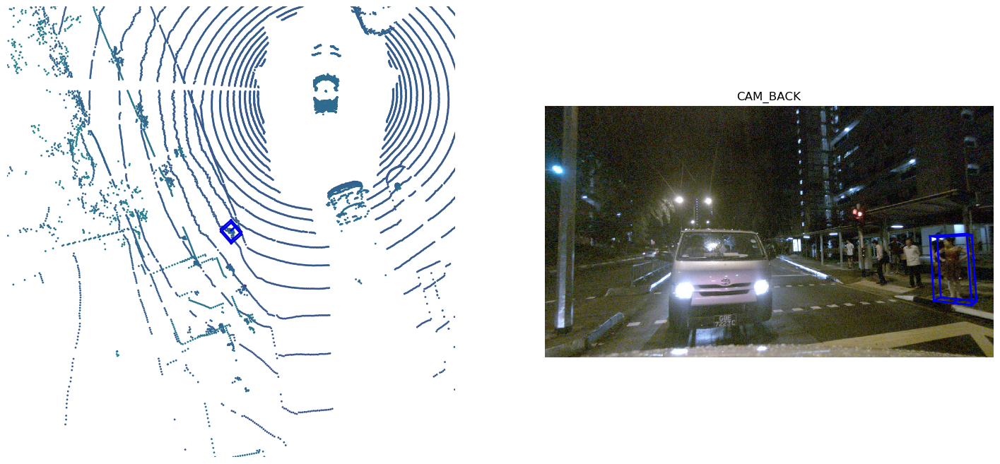

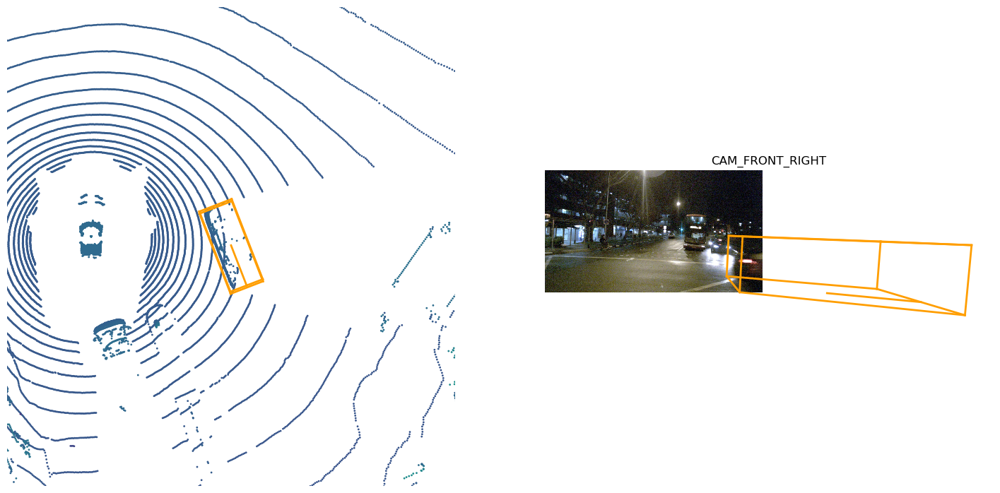

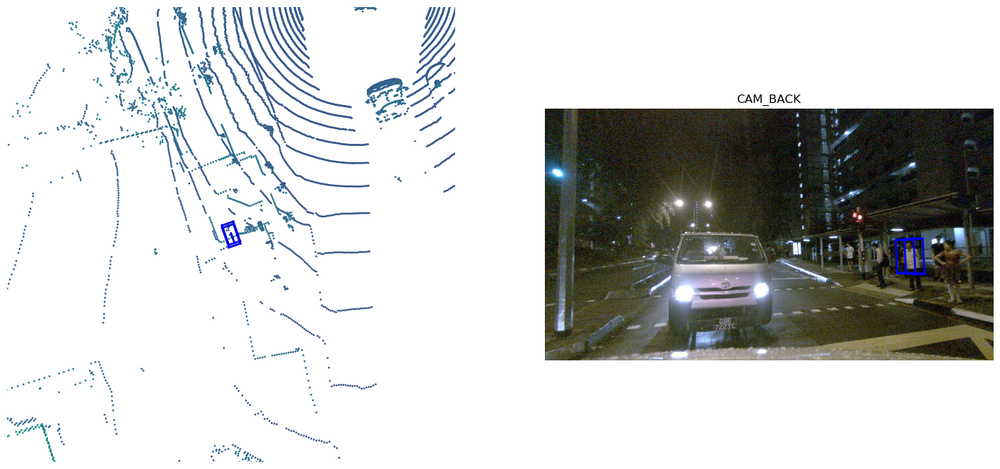

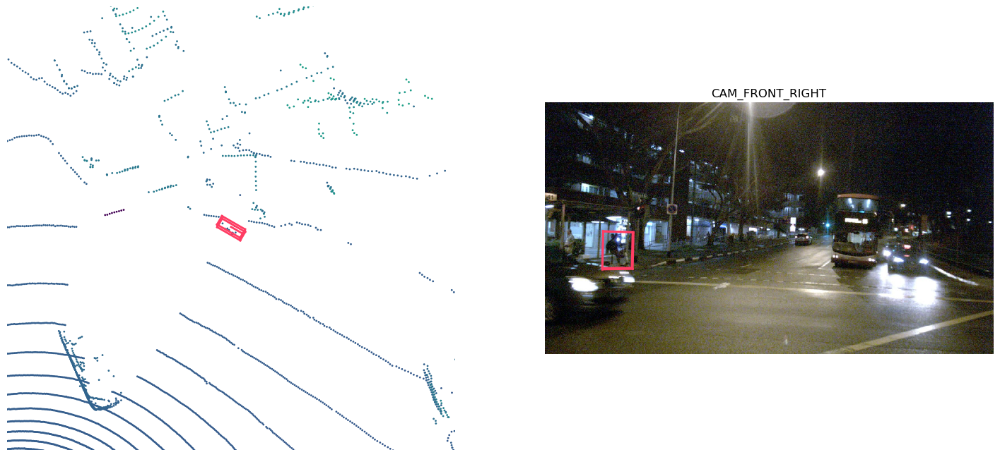

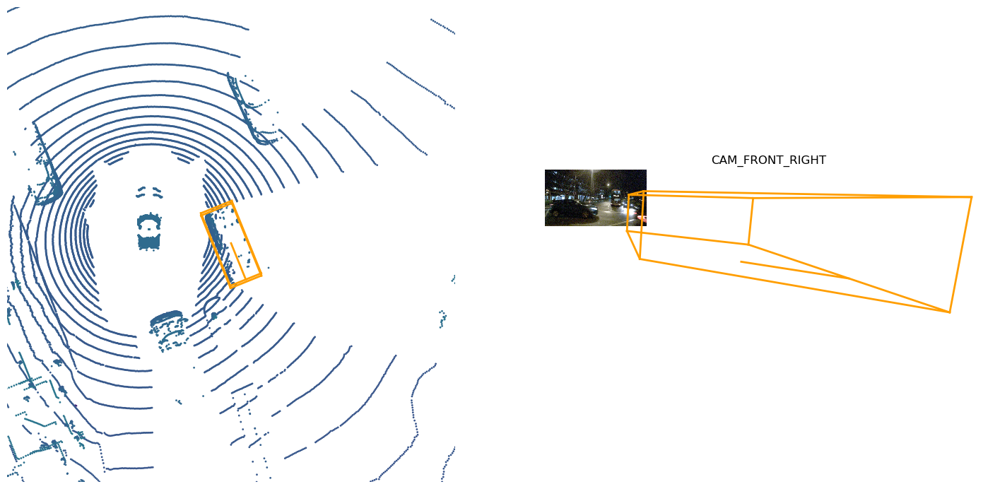

...

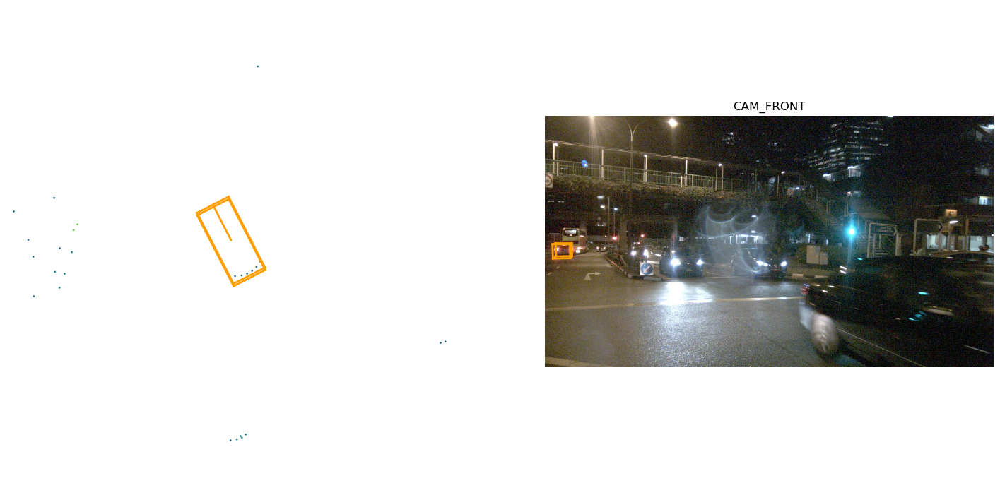

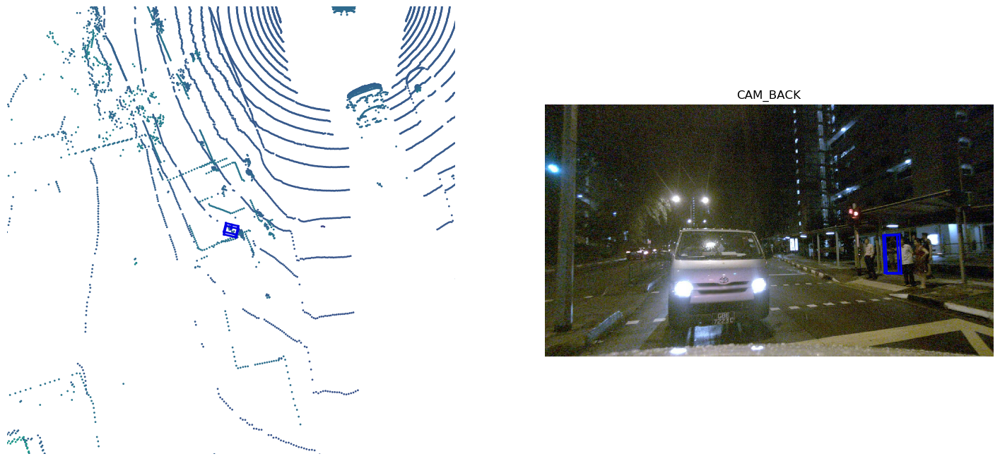

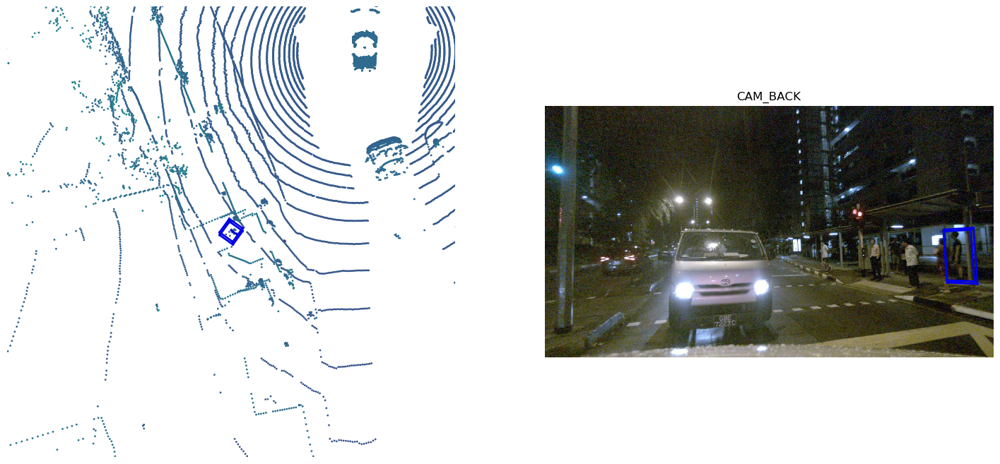

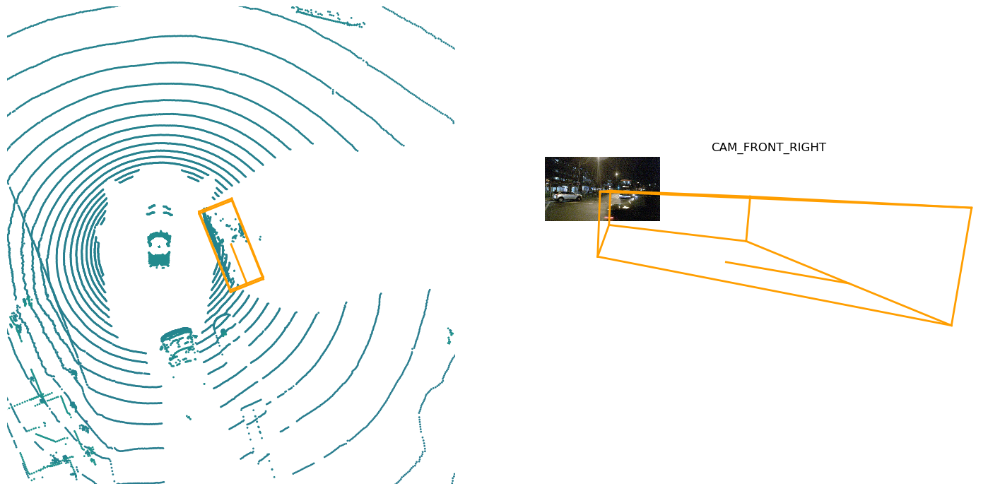

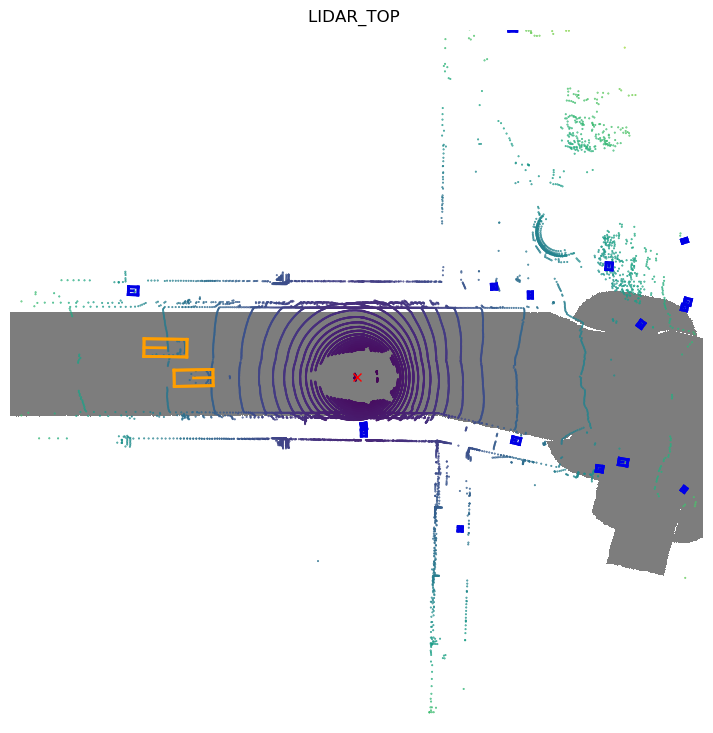

(30.16039597365411, 0.027803333333333333) (30.16039597365411, 0.027803333333333333)
(30.749090743209347, 0.027798333333333335) (30.749090743209347, 0.027798333333333335)
(30.125244686901087, 0.0278) (30.125244686901087, 0.0278)
(30.37326675278368, 0.027799166666666666) (30.37326675278368, 0.027799166666666666)
(30.844865728149134, 0.02780527777777778) (30.844865728149134, 0.02780527777777778)
(31.933665625302524, 0.0276475) (31.933665625302524, 0.0276475)
(32.565442907987105, 0.027800833333333334) (32.565442907987105, 0.027800833333333334)
(32.39399998000594, 0.027800277777777778) (32.39399998000594, 0.027800277777777778)
(32.45631088792554, 0.02780388888888889) (32.45631088792554, 0.02780388888888889)
(30.649226905687975, 0.02780138888888889) (30.649226905687975, 0.02780138888888889)
(25.759482615510827, 0.027643333333333332) (25.759482615510827, 0.027643333333333332)
(20.789654233316025, 0.02780111111111111) (20.789654233316025, 0.02780111111111111)
(17.551197053244696, 0.02764166666

In [2]:
from nuscenes.nuscenes import NuScenes
import numpy as np
%run -i NuScenes_functions.ipynb

In [ ]:
acceleration(v_vector[0], v_vector[-1], time)

In [3]:
nusc = NuScenes(version='v1.0-mini', dataroot='data/sets/nuscenes', verbose=True)

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 1.984 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.


In [4]:
nusc.list_scenes()

scene-0061, Parked truck, construction, intersectio... [18-07-24 03:28:47]   19s, singapore-onenorth, #anns:4622
scene-0103, Many peds right, wait for turning car, ... [18-08-01 19:26:43]   19s, boston-seaport, #anns:2046
scene-0655, Parking lot, parked cars, jaywalker, be... [18-08-27 15:51:32]   20s, boston-seaport, #anns:2332
scene-0553, Wait at intersection, bicycle, large tr... [18-08-28 20:48:16]   20s, boston-seaport, #anns:1950
scene-0757, Arrive at busy intersection, bus, wait ... [18-08-30 19:25:08]   20s, boston-seaport, #anns:592
scene-0796, Scooter, peds on sidewalk, bus, cars, t... [18-10-02 02:52:24]   20s, singapore-queensto, #anns:708
scene-0916, Parking lot, bicycle rack, parked bicyc... [18-10-08 07:37:13]   20s, singapore-queensto, #anns:2387
scene-1077, Night, big street, bus stop, high speed... [18-11-21 11:39:27]   20s, singapore-hollandv, #anns:890
scene-1094, Night, after rain, many peds, PMD, ped ... [18-11-21 11:47:27]   19s, singapore-hollandv, #anns:1762
sc

In [5]:
# Sample type and number of that sample
for i in range(len(nusc.scene)):
    my_scene = nusc.scene[i]
    description = my_scene['description']
    nbr_samples = my_scene['nbr_samples']
    print(description, ":", nbr_samples, "samples")

Parked truck, construction, intersection, turn left, following a van : 39 samples
Many peds right, wait for turning car, long bike rack left, cyclist : 40 samples
Wait at intersection, bicycle, large truck, peds crossing crosswalk, ped with stroller : 41 samples
Parking lot, parked cars, jaywalker, bendy bus, gardening vehicles : 41 samples
Arrive at busy intersection, bus, wait at intersection, bicycle, peds : 41 samples
Scooter, peds on sidewalk, bus, cars, truck, fake construction worker, bicycle, cross intersection, car overtaking us : 40 samples
Parking lot, bicycle rack, parked bicycles, bus, many peds, parked scooters, parked motorcycle : 41 samples
Night, big street, bus stop, high speed, construction vehicle : 41 samples
Night, after rain, many peds, PMD, ped with bag, jaywalker, truck, scooter : 40 samples
Night, peds in sidewalk, peds cross crosswalk, scooter, PMD, difficult lighting : 40 samples


In [6]:
# A sample example with its data
first_sample_token = my_scene['first_sample_token']
# The rendering command below is commented out because it tends to crash in notebooks
# nusc.render_sample(first_sample_token)
my_sample = nusc.get('sample', first_sample_token)
my_sample

{'token': 'a480496a5988410fbe3d8ed6c84da996',
 'timestamp': 1542800987947699,
 'prev': '',
 'next': 'b993550e60054741983f8052ba97b0b0',
 'scene_token': 'e233467e827140efa4b42d2b4c435855',
 'data': {'RADAR_FRONT': '511dba7f4aec41ea8baa9019ba97413c',
  'RADAR_FRONT_LEFT': 'b5a62f9cf0ac444cbd90c2f9ba7fedbf',
  'RADAR_FRONT_RIGHT': 'e95132afd0604448b6d522a09bad7e2d',
  'RADAR_BACK_LEFT': 'cb1a9aa2b8154fde9442eaa9fe11a958',
  'RADAR_BACK_RIGHT': 'f2008e1cb0194ee49a85243ed8261955',
  'LIDAR_TOP': 'b723df2123fe473d85512c9d02156c27',
  'CAM_FRONT': '51ceae8a5ecc4730950666723c135bc8',
  'CAM_FRONT_RIGHT': '4a85ae2a6329487abed596b0b7b6dfa4',
  'CAM_BACK_RIGHT': '646b51a45a2b4494a918ff89d36027e2',
  'CAM_BACK': 'd340a8d85c874b8d9e9ddf51a82a5908',
  'CAM_BACK_LEFT': 'c418396afb5a43a4af9a3b76278fd8d6',
  'CAM_FRONT_LEFT': '255a0637ea9a461989d7fb20f4ee126c'},
 'anns': ['9ca2a9ab9b5041278eea928681e09d89',
  '9dfee0c127f548acb80bf95610437acb',
  'b2222d3c49c447ba91247501e97d772b',
  '723bee443cf6433a9

# What I need to do:

Classification - check classification with RSS score to see if answer is correct.

Compare min lateral and longtudinal dists to actual distance. Maybe check actual lateral/longtudinal dists instead of distance from the centre of the car (not sure how to do this yet or if it is possible). Look at descriptions about the annotations to get a better idea of if they are on pavement or on the road. Not completely accurate but a start. Essentially, classify them.

Find safety score. Make regression plots and use other things learnt in iaml to make findings clear and draw more conclusions. Plot all the safety scores.

Once overall score has been found, use hypothesis testing to work out if the value is likely to be correct or not based on the other values etc. Not sure is this will be possible but we will see at after scores have been made. 